In [106]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
sns.set()
import warnings
warnings.filterwarnings("ignore")

# Data Processing

In [107]:
df = pd.read_csv('TravelInsurancePrediction.csv')

In [108]:
df_Ori =df.iloc[:,1:10]
df_Ori

,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
0,31,Government Sector,Yes,400000,6,1,No,No,0
1,31,Private Sector/Self Employed,Yes,1250000,7,0,No,No,0
2,34,Private Sector/Self Employed,Yes,500000,4,1,No,No,1
3,28,Private Sector/Self Employed,Yes,700000,3,1,No,No,0
4,28,Private Sector/Self Employed,Yes,700000,8,1,Yes,No,0
...,...,...,...,...,...,...,...,...,...
1982,33,Private Sector/Self Employed,Yes,1500000,4,0,Yes,Yes,1
1983,28,Private Sector/Self Employed,Yes,1750000,5,1,No,Yes,0
1984,28,Private Sector/Self Employed,Yes,1150000,6,1,No,No,0
1985,34,Private Sector/Self Employed,Yes,1000000,6,0,Yes,Yes,1


In [109]:
data = df_Ori
data = np.array(data)
data[data=='Yes'] = 1
data[data=='No'] = 0
data[data=='Government Sector'] = 0
data[data=='Private Sector/Self Employed']=1
df=pd.DataFrame(data, columns=["Age","Employment Type","GraduateOrNot","AnnualIncome","FamilyMembers", "ChronicDiseases","FrequentFlyer","EverTravelledAbroad","TravelInsurance"])
df = df.astype({"Age":int,"Employment Type":int,"GraduateOrNot":int,"AnnualIncome":int,"FamilyMembers":int, "ChronicDiseases":int,"FrequentFlyer":int,"EverTravelledAbroad":int,"TravelInsurance":int})
data=df
data

,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
0,31,0,1,400000,6,1,0,0,0
1,31,1,1,1250000,7,0,0,0,0
2,34,1,1,500000,4,1,0,0,1
3,28,1,1,700000,3,1,0,0,0
4,28,1,1,700000,8,1,1,0,0
...,...,...,...,...,...,...,...,...,...
1982,33,1,1,1500000,4,0,1,1,1
1983,28,1,1,1750000,5,1,0,1,0
1984,28,1,1,1150000,6,1,0,0,0
1985,34,1,1,1000000,6,0,1,1,1


In [110]:
data.describe()

,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad,TravelInsurance
count,1987.000000,1987.000000,1987.000000,1.987000e+03,1987.000000,1987.000000,1987.000000,1987.000000,1987.000000
mean,29.650226,0.713135,0.851535,9.327630e+05,4.752894,0.277806,0.209864,0.191243,0.357323
std,2.913308,0.452412,0.355650,3.768557e+05,1.609650,0.448030,0.407314,0.393379,0.479332
min,25.000000,0.000000,0.000000,3.000000e+05,2.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,0.000000,1.000000,6.000000e+05,4.000000,0.000000,0.000000,0.000000,0.000000
50%,29.000000,1.000000,1.000000,9.000000e+05,5.000000,0.000000,0.000000,0.000000,0.000000
75%,32.000000,1.000000,1.000000,1.250000e+06,6.000000,1.000000,0.000000,0.000000,1.000000
max,35.000000,1.000000,1.000000,1.800000e+06,9.000000,1.000000,1.000000,1.000000,1.000000


# Data Visualization

In [111]:
data.groupby('TravelInsurance').mean()

,Age,Employment Type,GraduateOrNot,AnnualIncome,FamilyMembers,ChronicDiseases,FrequentFlyer,EverTravelledAbroad
TravelInsurance,,,,,,,,
0,29.517619,0.663273,0.846515,8.212999e+05,4.657009,0.271731,0.139389,0.064213
1,29.888732,0.802817,0.860563,1.133239e+06,4.925352,0.288732,0.336620,0.419718


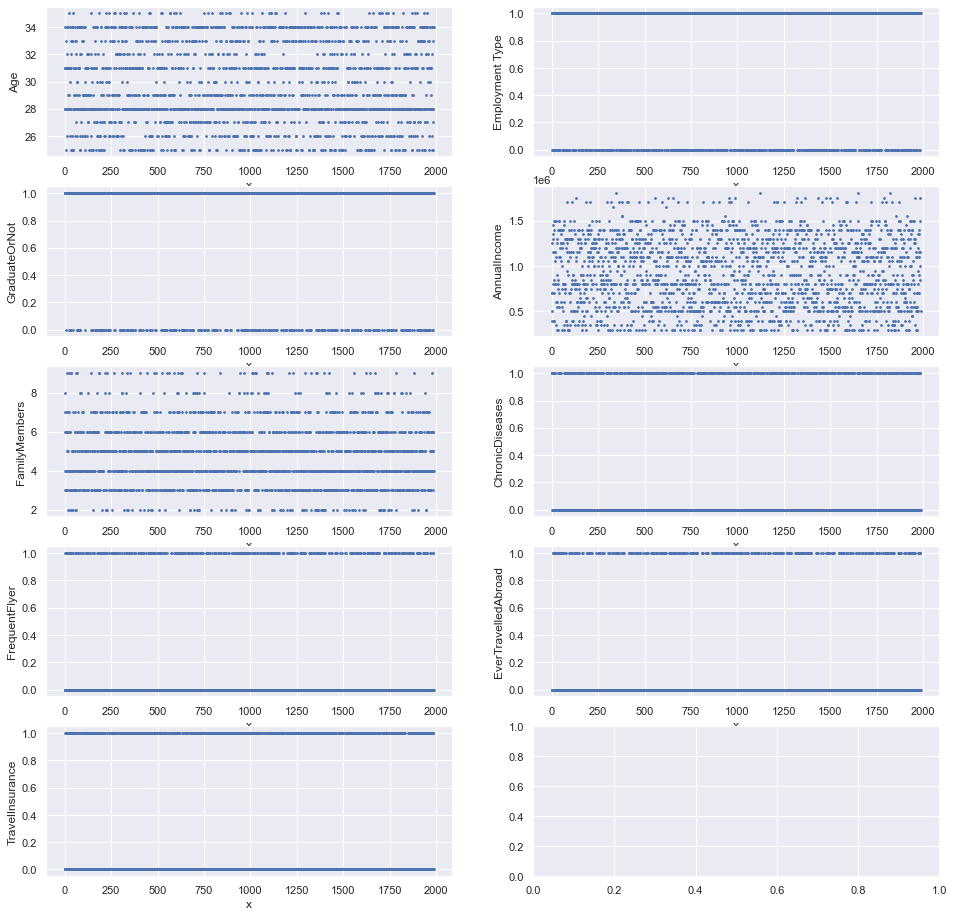

In [112]:
fig, ax = plt.subplots(5,2 , figsize=(16, 16))
r = 0
c = 0
plot_x = range(data.shape[0])
for i in range(len(df.columns)):
    ax[r][c].scatter(plot_x, df[df.columns[i]], s=3)
    ax[r][c].set_xlabel('x')
    ax[r][c].set_ylabel(df.columns[i])
    c += 1
    if c == 2:
        c = 0
        r += 1

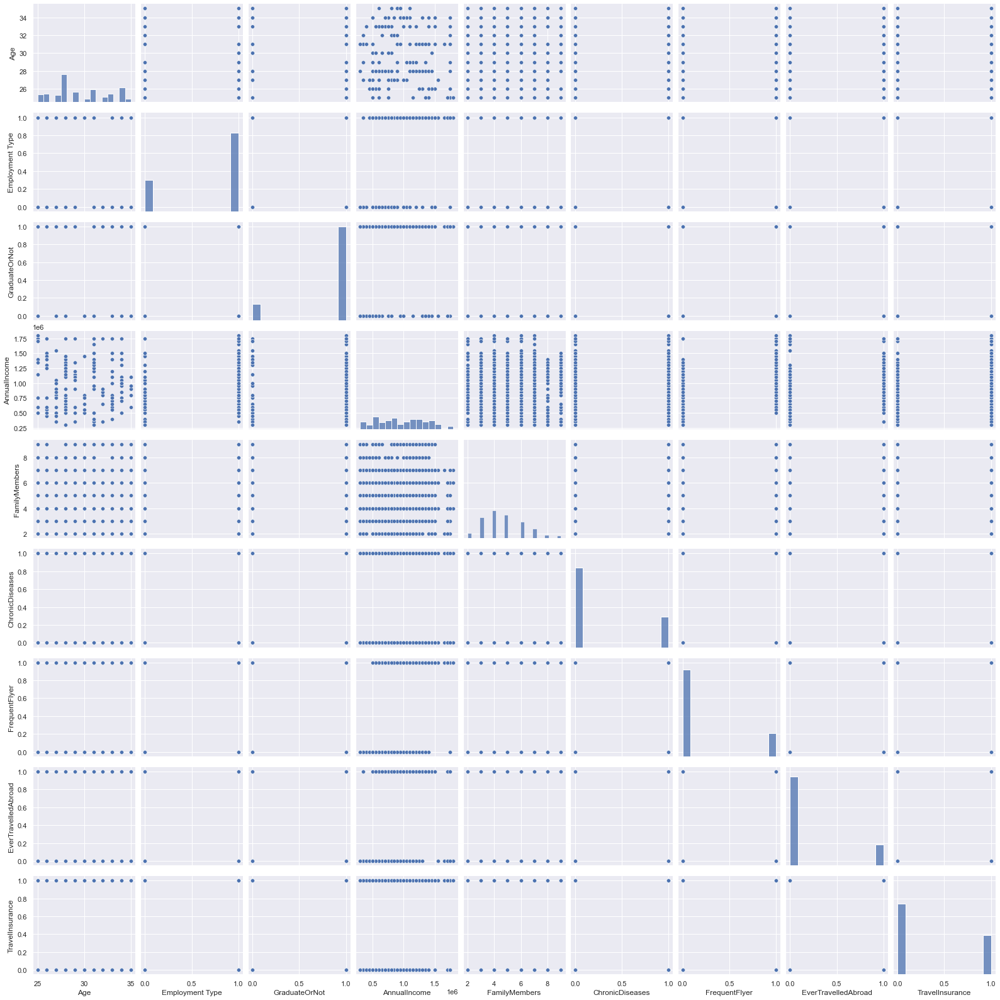

In [113]:
sns.pairplot(df)

### TravelInsurance Distribution

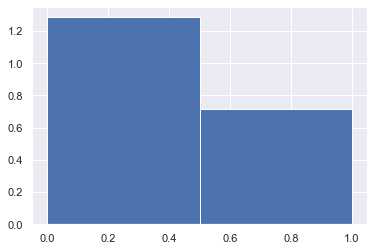

In [114]:
x_TI = data.TravelInsurance.values
n, bins, patches = plt.hist(x_TI, bins=2, histtype = 'bar',\
                            density = True, color='b')

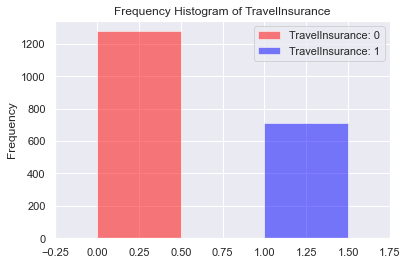

In [115]:
x1_TI = data.loc[data.TravelInsurance== 0, 'TravelInsurance']
x2_TI = data.loc[data.TravelInsurance== 1, 'TravelInsurance']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_TI, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_TI, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of TravelInsurance', ylabel='Frequency')
plt.xlim(-0.25,1.75)
plt.legend()

In [116]:
cross_tab_prop = pd.crosstab(index=df_Ori['TravelInsurance'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
TravelInsurance,,
0,1.0,0.0
1,0.0,1.0


In [117]:
cross_tab = pd.crosstab(index=df_Ori['TravelInsurance'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
TravelInsurance,,
0,1277,0
1,0,710


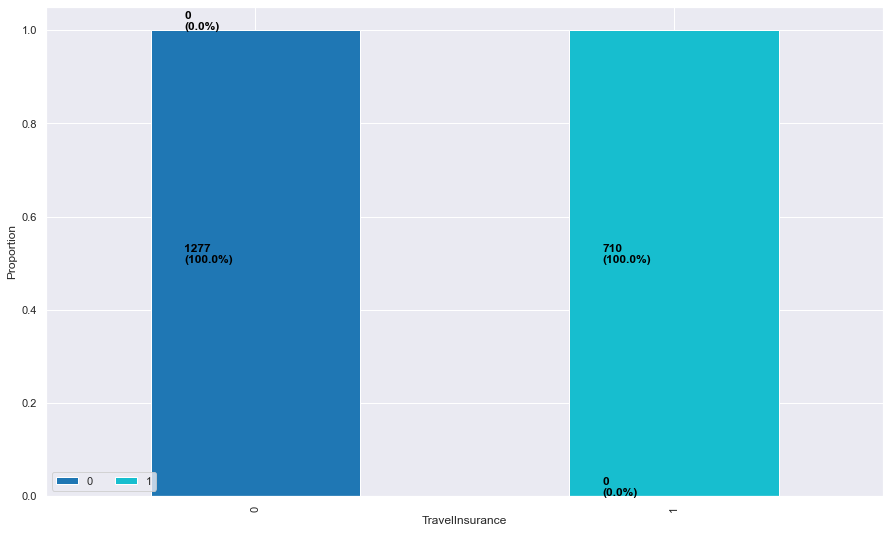

In [118]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("TravelInsurance")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

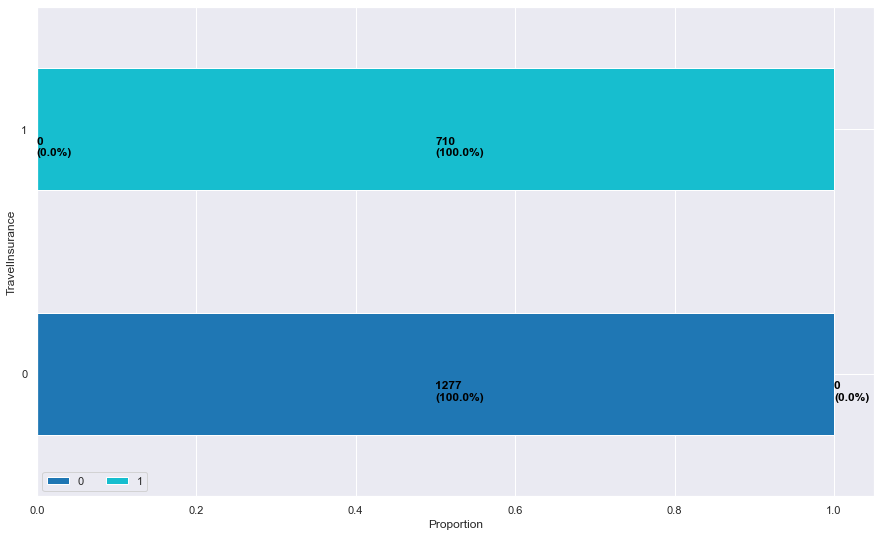

In [119]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("TravelInsurance")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

### Age Distribution

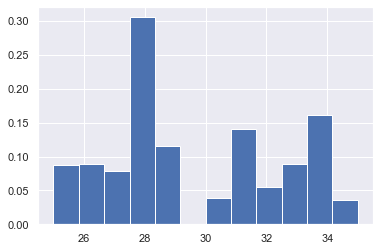

In [120]:
x_Age= data.Age.values
n, bins, patches = plt.hist(x_Age, bins=12, histtype = 'bar',\
                            density = True, color='b')

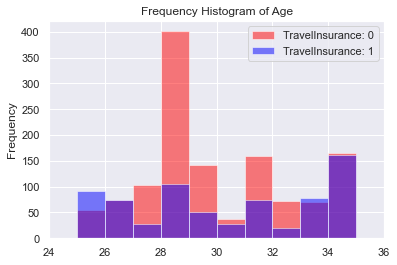

In [121]:
x1_AGE = data.loc[data.TravelInsurance== 0, 'Age']
x2_AGE = data.loc[data.TravelInsurance== 1, 'Age']
kwargs = dict(alpha=0.5, bins=10) 
plt.hist(x1_AGE, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_AGE, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of Age', ylabel='Frequency')
plt.xlim(24,36)
plt.legend()

In [122]:
cross_tab_prop = pd.crosstab(index=df_Ori['Age'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
Age,,
25,0.369863,0.630137
26,0.500000,0.500000
27,0.793893,0.206107
28,0.792490,0.207510
29,0.734375,0.265625
30,0.569231,0.430769
31,0.679487,0.320513
32,0.791209,0.208791
33,0.472973,0.527027


In [123]:
cross_tab = pd.crosstab(index=df_Ori['Age'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
Age,,
25,54,92
26,74,74
27,104,27
28,401,105
29,141,51
30,37,28
31,159,75
32,72,19
33,70,78


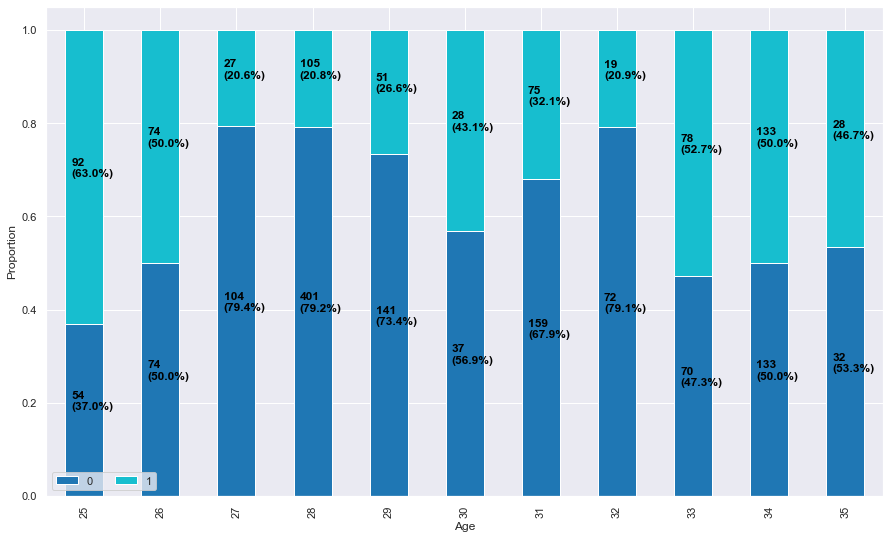

In [124]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("Age")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

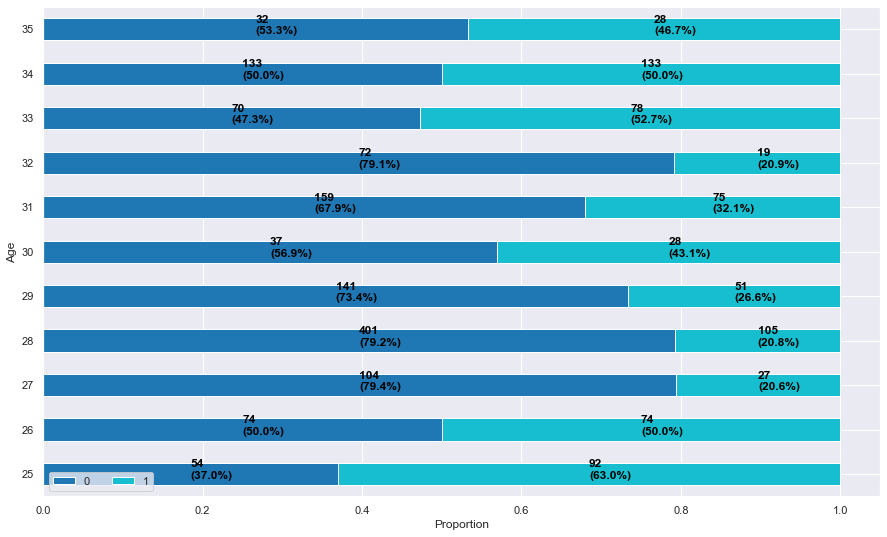

In [125]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Age")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

### Employment Type Distribution

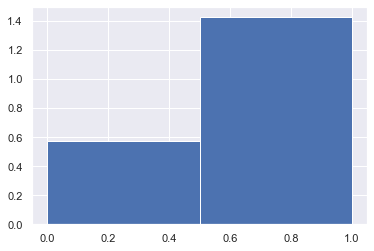

In [126]:
x_ET = data["Employment Type"].values
n, bins, patches = plt.hist(x_ET, bins=2, histtype = 'bar',\
                            density = True, color='b')

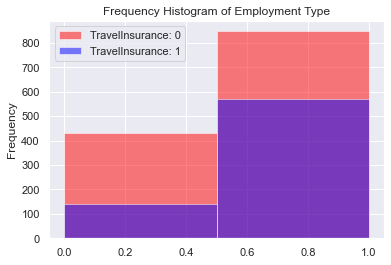

In [127]:
x1_ET = data.loc[data.TravelInsurance== 0, 'Employment Type']
x2_ET = data.loc[data.TravelInsurance== 1, 'Employment Type']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_ET, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_ET, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of Employment Type', ylabel='Frequency')
plt.xlim
plt.legend()

In [128]:
cross_tab_prop = pd.crosstab(index=df_Ori['Employment Type'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
Employment Type,,
Government Sector,0.754386,0.245614
Private Sector/Self Employed,0.597742,0.402258


In [129]:
cross_tab = pd.crosstab(index=df_Ori['Employment Type'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
Employment Type,,
Government Sector,430,140
Private Sector/Self Employed,847,570


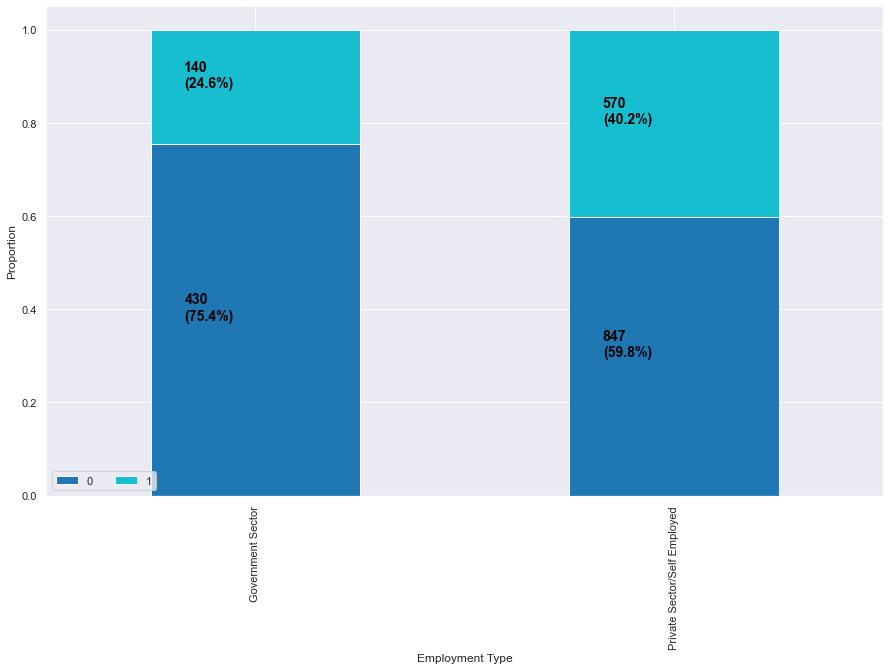

In [130]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("Employment Type")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

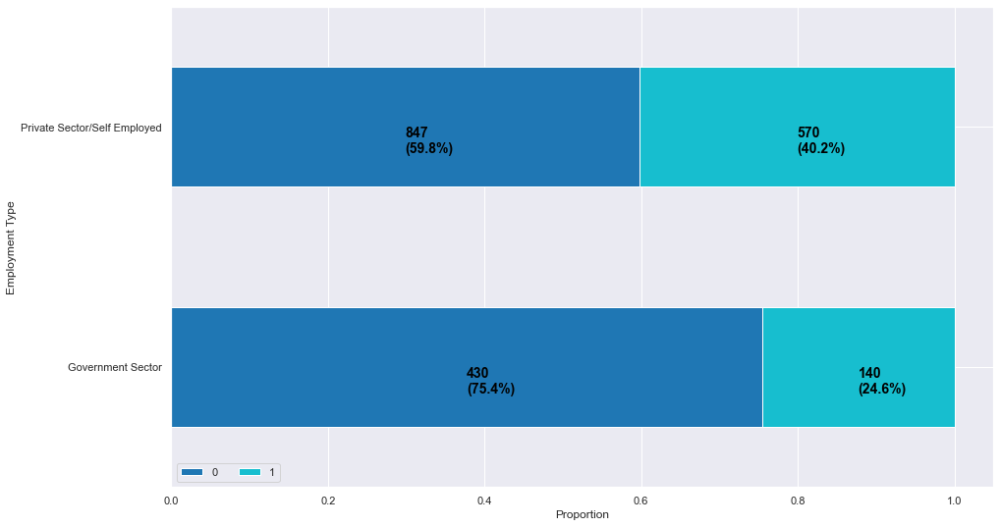

In [131]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("Employment Type")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### GraduateOrNot Distribution

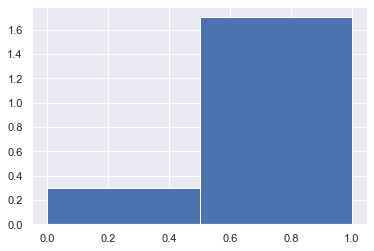

In [132]:
x_GON = data.GraduateOrNot.values
n, bins, patches = plt.hist(x_GON, bins=2, histtype = 'bar',\
                            density = True, color='b')

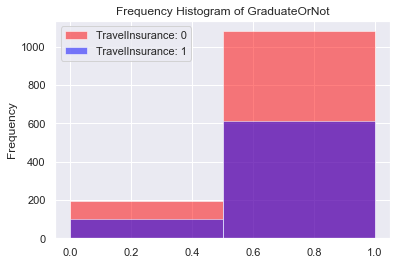

In [133]:
x1_GON = data.loc[data.TravelInsurance== 0, 'GraduateOrNot']
x2_GON = data.loc[data.TravelInsurance== 1, 'GraduateOrNot']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_GON, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_GON, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of GraduateOrNot', ylabel='Frequency')
plt.xlim
plt.legend()

In [134]:
cross_tab_prop = pd.crosstab(index=df_Ori['GraduateOrNot'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
GraduateOrNot,,
No,0.664407,0.335593
Yes,0.638889,0.361111


In [135]:
cross_tab = pd.crosstab(index=df_Ori['GraduateOrNot'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
GraduateOrNot,,
No,196,99
Yes,1081,611


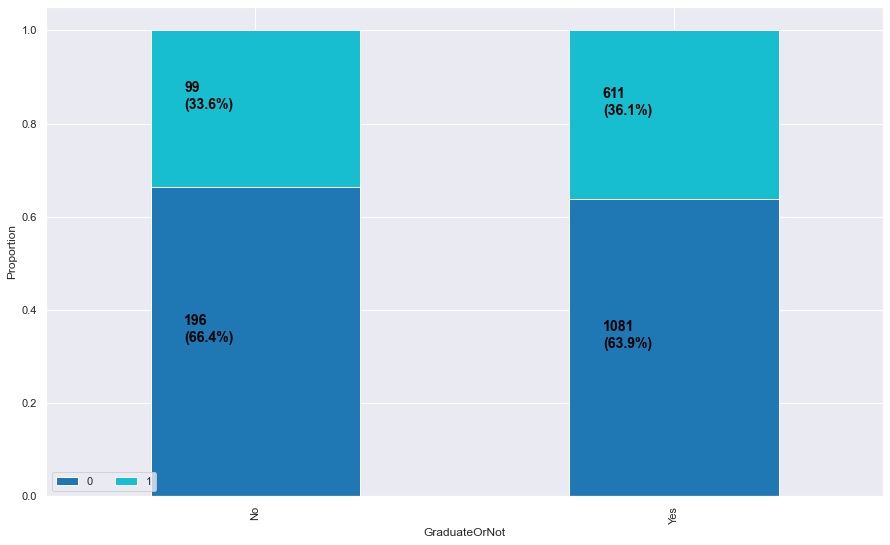

In [136]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("GraduateOrNot")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

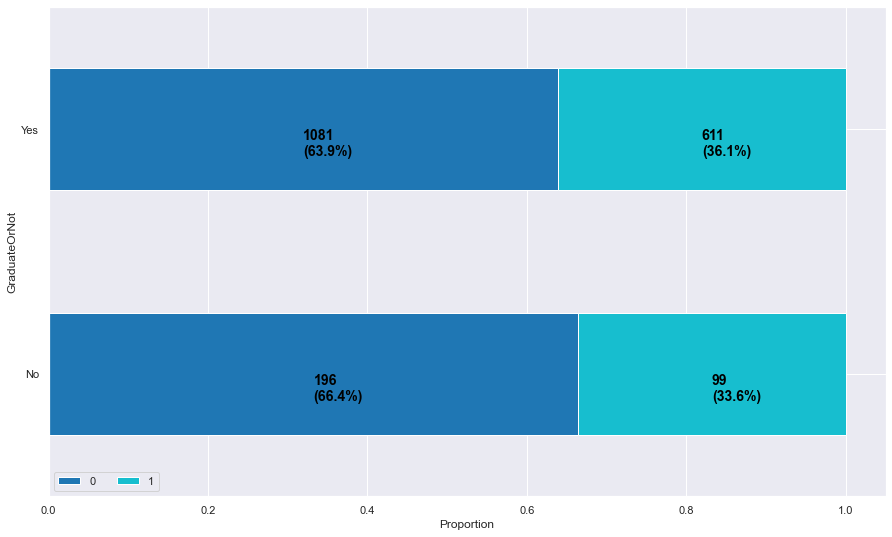

In [137]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("GraduateOrNot")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### AnnualIncome Distribution

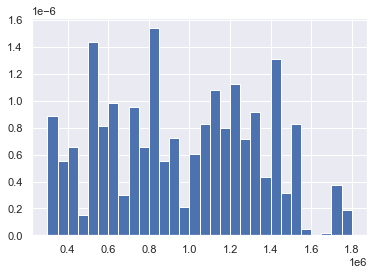

In [138]:
x_AI = data.AnnualIncome.values
n, bins, patches = plt.hist(x_AI, bins=30, histtype = 'bar',\
                            density = True, color='b')

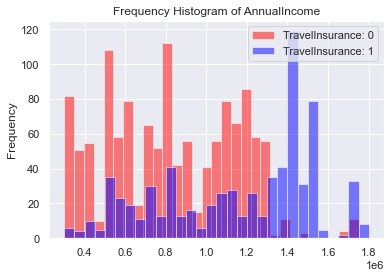

In [139]:
x1_AI = data.loc[data.TravelInsurance== 0, 'AnnualIncome']
x2_AI = data.loc[data.TravelInsurance== 1, 'AnnualIncome']
kwargs = dict(alpha=0.5, bins=30)
plt.hist(x1_AI, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_AI, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of AnnualIncome', ylabel='Frequency')
plt.xlim
plt.legend()

In [140]:
cross_tab_prop = pd.crosstab(index=df_Ori['AnnualIncome'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
AnnualIncome,,
300000,0.931818,0.068182
350000,0.927273,0.072727
400000,0.846154,0.153846
450000,0.666667,0.333333
500000,0.755245,0.244755
550000,0.716049,0.283951
600000,0.806122,0.193878
650000,0.633333,0.366667
700000,0.684211,0.315789


In [141]:
cross_tab = pd.crosstab(index=df_Ori['AnnualIncome'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
AnnualIncome,,
300000,82,6
350000,51,4
400000,55,10
450000,10,5
500000,108,35
550000,58,23
600000,79,19
650000,19,11
700000,65,30


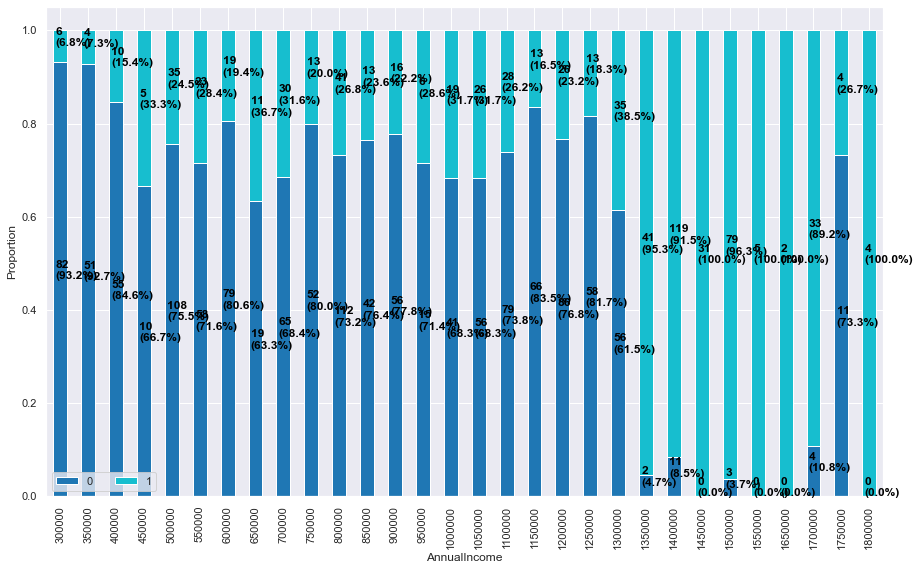

In [142]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("AnnualIncome")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

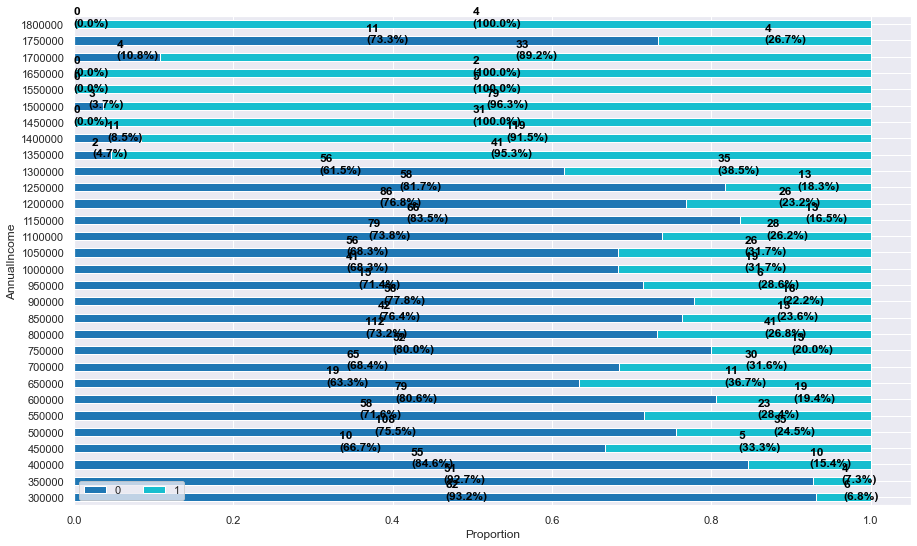

In [143]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("AnnualIncome")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=12,
                 fontweight="bold")

plt.show()

### FamilyMembers Distribution

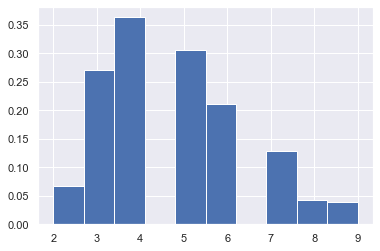

In [144]:
x_FM = data.FamilyMembers.values
n, bins, patches = plt.hist(x_FM, bins=10, histtype = 'bar',\
                            density = True, color='b')

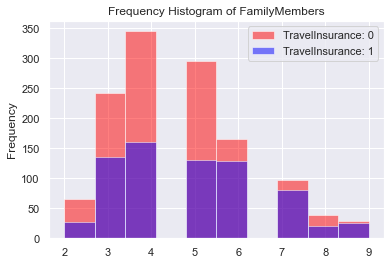

In [145]:
x1_FM = data.loc[data.TravelInsurance== 0, 'FamilyMembers']
x2_FM = data.loc[data.TravelInsurance== 1, 'FamilyMembers']
kwargs = dict(alpha=0.5, bins=10)
plt.hist(x1_FM, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_FM, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of FamilyMembers', ylabel='Frequency')
plt.xlim
plt.legend()

In [146]:
cross_tab_prop = pd.crosstab(index=df_Ori['FamilyMembers'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
FamilyMembers,,
2,0.709677,0.290323
3,0.641910,0.358090
4,0.683168,0.316832
5,0.692488,0.307512
6,0.561224,0.438776
7,0.544944,0.455056
8,0.644068,0.355932
9,0.527273,0.472727


In [147]:
cross_tab = pd.crosstab(index=df_Ori['FamilyMembers'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
FamilyMembers,,
2,66,27
3,242,135
4,345,160
5,295,131
6,165,129
7,97,81
8,38,21
9,29,26


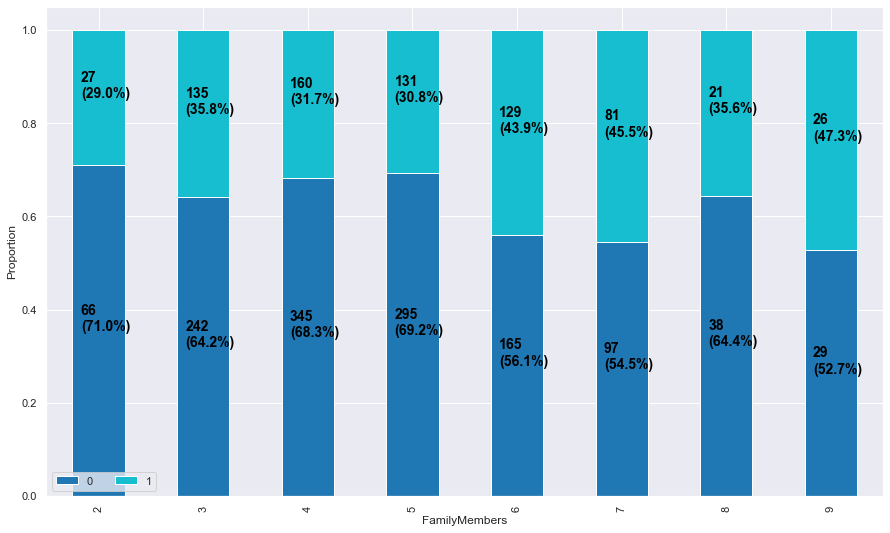

In [148]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("FamilyMembers")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

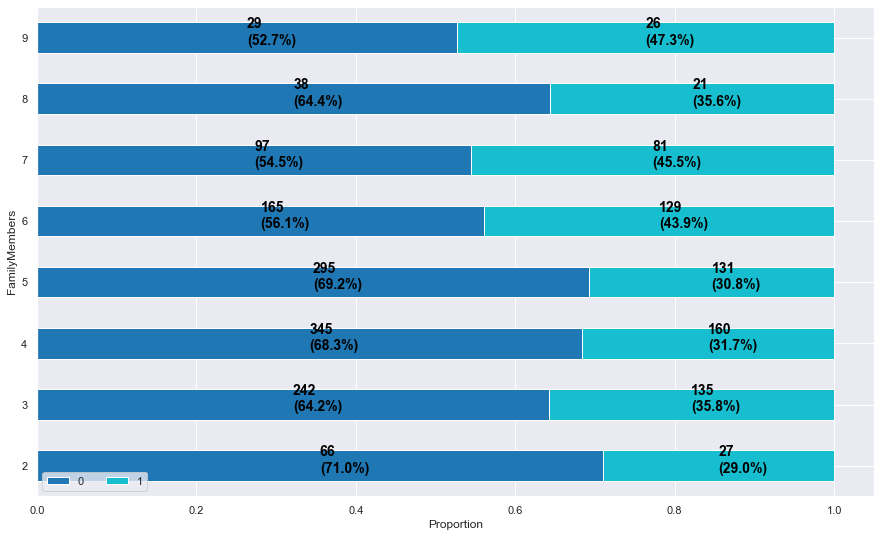

In [149]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("FamilyMembers")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### ChronicDiseases Distribution

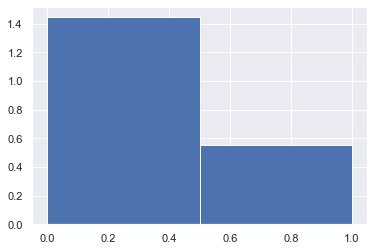

In [150]:
x_CD = data.ChronicDiseases.values
n, bins, patches = plt.hist(x_CD, bins=2, histtype = 'bar',\
                            density = True, color='b')

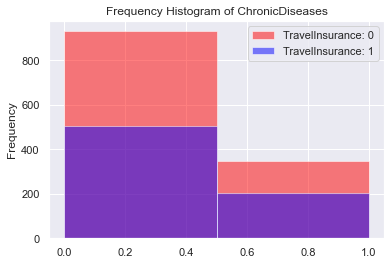

In [151]:
x1_CD = data.loc[data.TravelInsurance== 0, 'ChronicDiseases']
x2_CD = data.loc[data.TravelInsurance== 1, 'ChronicDiseases']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_CD, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_CD, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of ChronicDiseases', ylabel='Frequency')
plt.xlim
plt.legend()

In [152]:
cross_tab_prop = pd.crosstab(index=df_Ori['ChronicDiseases'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
ChronicDiseases,,
0,0.648084,0.351916
1,0.628623,0.371377


In [153]:
cross_tab = pd.crosstab(index=df_Ori['ChronicDiseases'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
ChronicDiseases,,
0,930,505
1,347,205


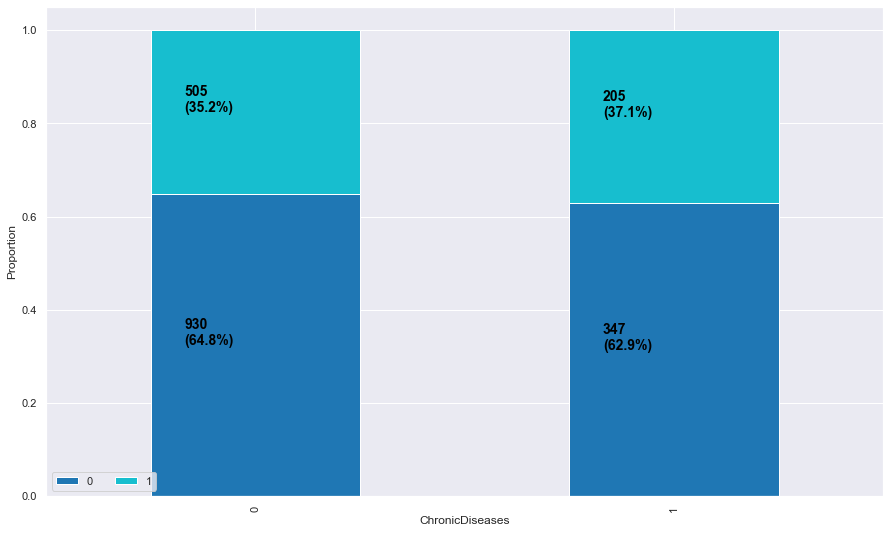

In [154]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("ChronicDiseases")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

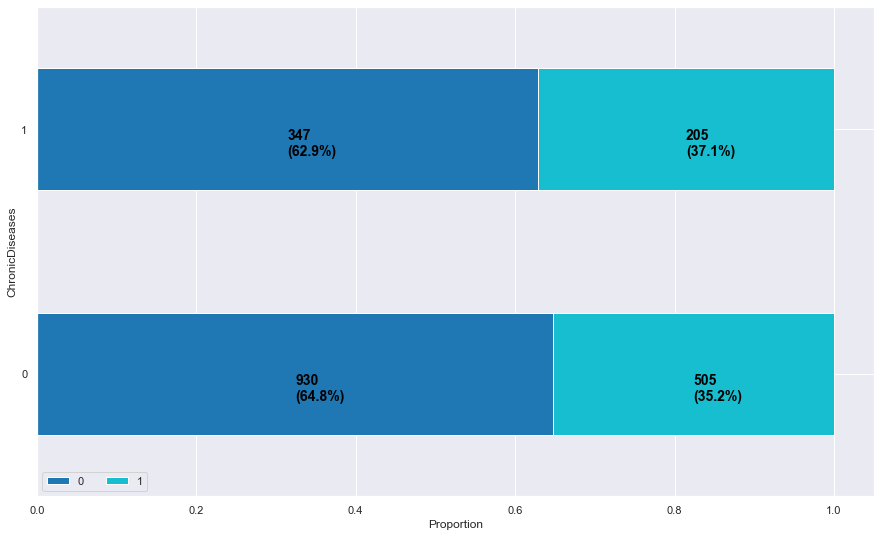

In [155]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("ChronicDiseases")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### FrequentFlyer Distribution

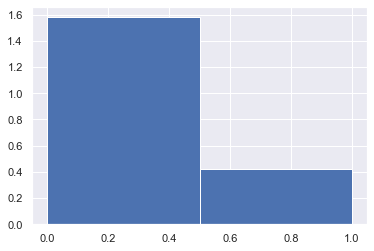

In [156]:
x_FF = data.FrequentFlyer.values
n, bins, patches = plt.hist(x_FF, bins=2, histtype = 'bar',\
                            density = True, color='b')

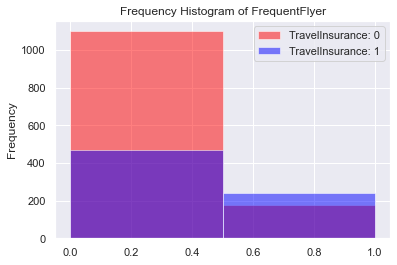

In [157]:
x1_FF = data.loc[data.TravelInsurance== 0, 'FrequentFlyer']
x2_FF = data.loc[data.TravelInsurance== 1, 'FrequentFlyer']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_FF, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_FF, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of FrequentFlyer', ylabel='Frequency')
plt.xlim
plt.legend()

In [158]:
cross_tab_prop = pd.crosstab(index=df_Ori['FrequentFlyer'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
FrequentFlyer,,
No,0.700000,0.300000
Yes,0.426859,0.573141


In [159]:
cross_tab = pd.crosstab(index=df_Ori['FrequentFlyer'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
FrequentFlyer,,
No,1099,471
Yes,178,239


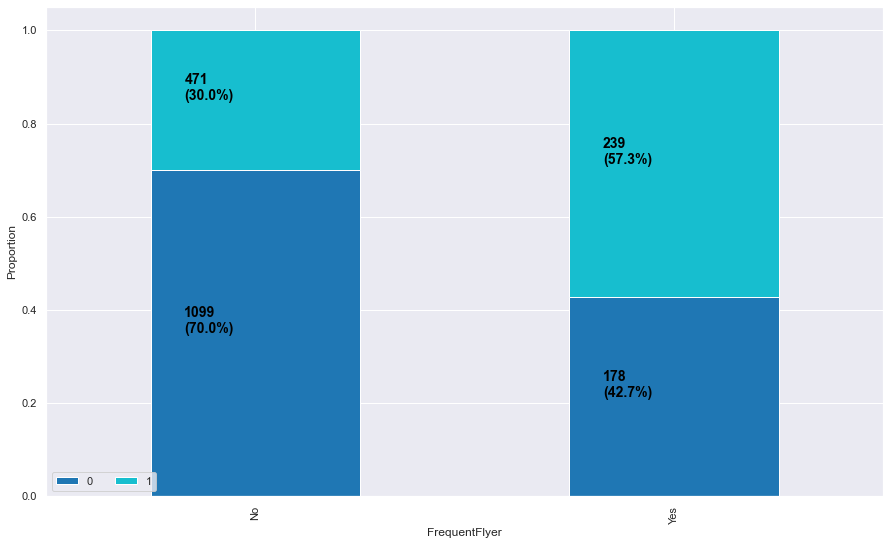

In [160]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("FrequentFlyer")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

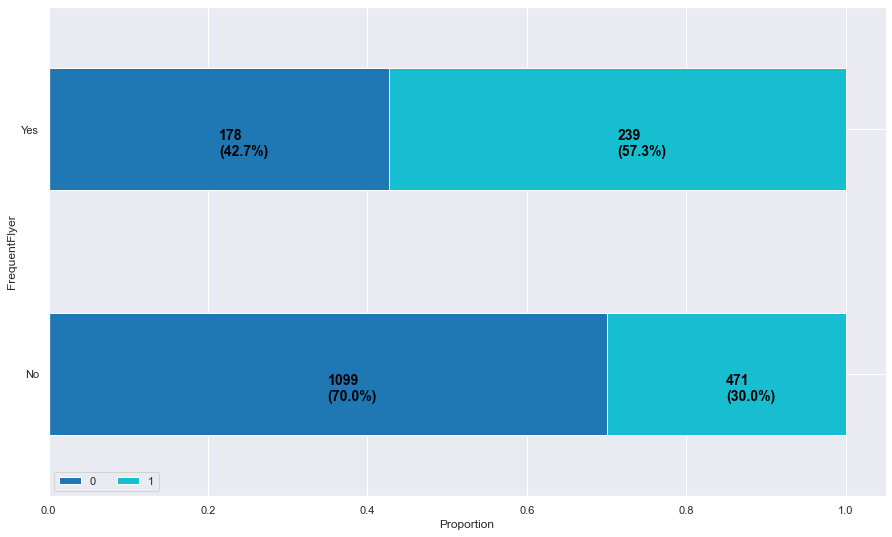

In [161]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("FrequentFlyer")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### EverTravelledAbroad Distribution

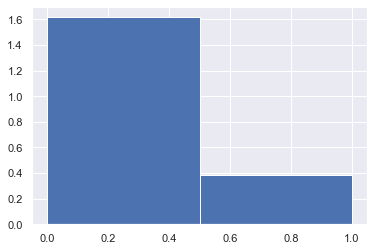

In [162]:
x_ETA = data.EverTravelledAbroad.values
n, bins, patches = plt.hist(x_ETA, bins=2, histtype = 'bar',\
                            density = True, color='b')

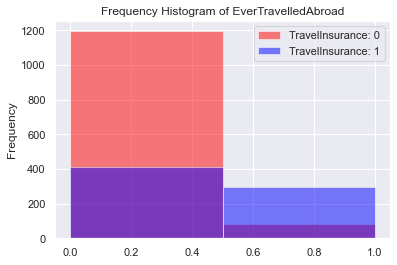

In [163]:
x1_ETA = data.loc[data.TravelInsurance== 0, 'EverTravelledAbroad']
x2_ETA = data.loc[data.TravelInsurance== 1, 'EverTravelledAbroad']
kwargs = dict(alpha=0.5, bins=2)
plt.hist(x1_ETA, **kwargs, color='red', label='TravelInsurance: 0')
plt.hist(x2_ETA, **kwargs, color='blue', label='TravelInsurance: 1')
plt.gca().set(title='Frequency Histogram of EverTravelledAbroad', ylabel='Frequency')
plt.xlim
plt.legend()

In [164]:
cross_tab_prop = pd.crosstab(index=df_Ori['EverTravelledAbroad'],
                             columns=df_Ori['TravelInsurance'],
                             normalize="index")
cross_tab_prop

TravelInsurance,0,1
EverTravelledAbroad,,
No,0.743622,0.256378
Yes,0.215789,0.784211


In [165]:
cross_tab = pd.crosstab(index=df_Ori['EverTravelledAbroad'],
                        columns=df_Ori['TravelInsurance'])
cross_tab

TravelInsurance,0,1
EverTravelledAbroad,,
No,1195,412
Yes,82,298


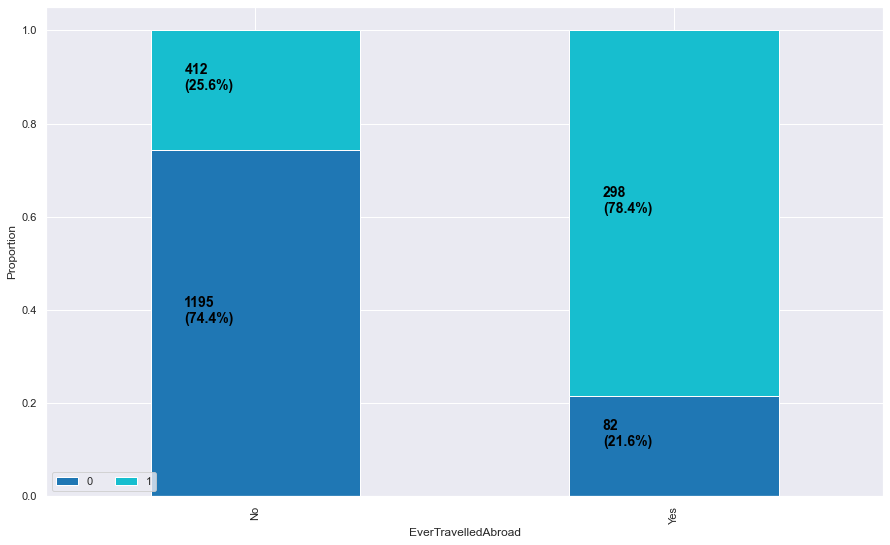

In [166]:
cross_tab_prop.plot(kind='bar', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.xlabel("EverTravelledAbroad")
plt.ylabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=n - 0.17,
                 y=(y_loc - proportion) + (proportion / 2),
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

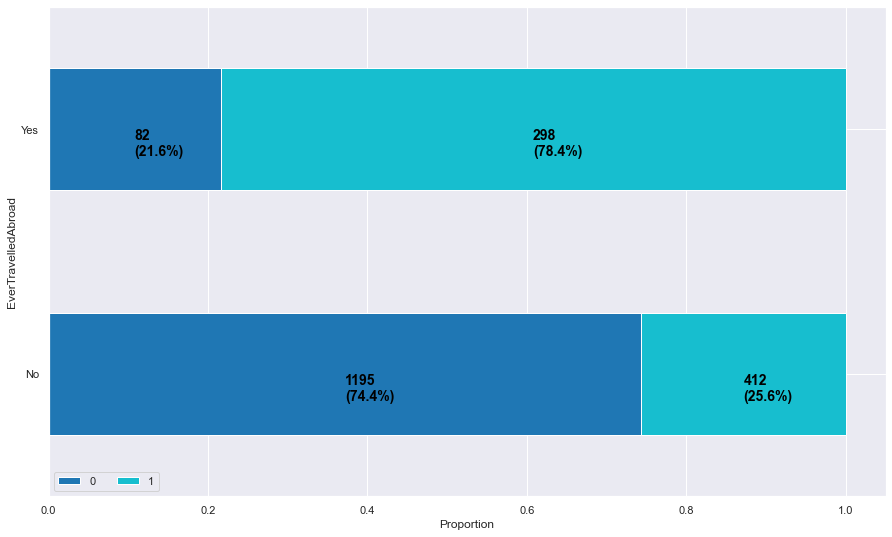

In [167]:
cross_tab_prop.plot(kind='barh', 
                        stacked=True, 
                        colormap='tab10', 
                        figsize=(15, 9))

plt.legend(loc="lower left", ncol=2)
plt.ylabel("EverTravelledAbroad")
plt.xlabel("Proportion")


for n, x in enumerate([*cross_tab.index.values]):
    for (proportion, count, y_loc) in zip(cross_tab_prop.loc[x],
                                          cross_tab.loc[x],
                                          cross_tab_prop.loc[x].cumsum()):
                
        plt.text(x=(y_loc - proportion) + (proportion / 2),
                 y=n - 0.11,
                 s=f'{count}\n({np.round(proportion * 100, 1)}%)', 
                 color="black",
                 fontsize=14,
                 fontweight="bold")

plt.show()

### Heatmap- correlation

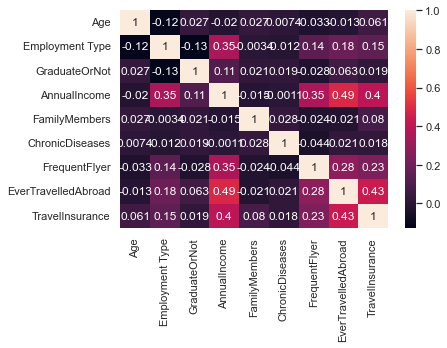

In [168]:
ax = sns.heatmap(data.corr(), annot=True)

# Modeling with all Parameters

In [169]:
y = data.TravelInsurance.values
x_data = data.drop(['TravelInsurance'], axis = 1)

In [170]:
# Normalize
from sklearn.preprocessing import StandardScaler
ss_fit = StandardScaler().fit(x_data)
x = ss_fit.transform(x_data)

In [171]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=0)

In [172]:
x_train = x_train.T
y_train = y_train.T
x_test = x_test.T
y_test = y_test.T

In [173]:
#default
def default(dimension):
    
    weight = np.full((dimension,1),0.01)
    bias = 0.00
    return weight,bias

In [174]:
def sigmoid(x):
    
    y_head = 1/(1+ np.exp(-x))
    return y_head

In [175]:
def Gradients_ForwardBackward(weight,bias,x_train,y_train):
    # Forward
    
    y_head = sigmoid(np.dot(weight.T,x_train) + bias)
    loss = -(y_train*np.log(y_head) + (1-y_train)*np.log(1-y_head))
    cost = np.sum(loss) / x_train.shape[1]
    
    # Backward
    de_weight = np.dot(x_train,((y_head-y_train).T))/x_train.shape[1]
    de_bias = np.sum(y_head-y_train)/x_train.shape[1]
    gradients = {"Derivative Weight" : de_weight, "Derivative Bias" : de_bias}
    
    return cost,gradients

In [176]:
def update(weight,bias,x_train,y_train,learningRate,iteration) :
    costList = []
    index = []
    
    #for each iteration, update weight and bias values
    for i in range(iteration):
        cost,gradients = Gradients_ForwardBackward(weight,bias,x_train,y_train)
        weight = weight - learningRate * gradients["Derivative Weight"]
        bias = bias - learningRate * gradients["Derivative Bias"]
        
        costList.append(cost)
        index.append(i)

    parameters = {"weight": weight,"bias": bias}
    
    print("iteration:",iteration)
    print("cost:",cost)

    plt.plot(index,costList)
    plt.xlabel("Number of Iteration")
    plt.ylabel("Cost")
    plt.show()

    return parameters, gradients

In [177]:
def update1(weight,bias,x_train,y_train,learningRate,iteration) :
    costList = []
    index = []
    
    #for each iteration, update weight and bias values
    for i in range(iteration):
        cost,gradients = Gradients_ForwardBackward(weight,bias,x_train,y_train)
        weight = weight - learningRate * gradients["Derivative Weight"]
        bias = bias - learningRate * gradients["Derivative Bias"]
        
        costList.append(cost)
        index.append(i)

    parameters = {"weight": weight,"bias": bias}
    

    return parameters, gradients

In [178]:
def predict(weight,bias,x_test):
    u = np.dot(weight.T,x_test) + bias
    y_head = sigmoid(u)

    y_prediction = np.zeros((1,x_test.shape[1]))
    
    for i in range(y_head.shape[1]):
        if y_head[0,i] <= 0.5:
            y_prediction[0,i] = 0
        else:
            y_prediction[0,i] = 1
    return y_prediction

In [179]:
def logistic_regression(x_train,y_train,x_test,y_test,learningRate,iteration):
    dimension = x_train.shape[0]
    weight,bias = default(dimension)
    
    parameters, gradients = update(weight,bias,x_train,y_train,learningRate,iteration)

    y_prediction = predict(parameters["weight"],parameters["bias"],x_test)
    
    return (100 - np.mean(np.abs(y_prediction - y_test))*100)

In [180]:
def lrnn_yhead(x_train,y_train,x_test,y_test,learningRate,iteration):
    dimension = x_train.shape[0]
    weight,bias = default(dimension)
    
    parameters, gradients = update1(weight,bias,x_train,y_train,learningRate,iteration)

    y_prediction = predict(parameters["weight"],parameters["bias"],x_test)
    
    return y_prediction

In [181]:
accuracies = {}

In [182]:
x_data.T.iloc[:,0]

Age                        31
Employment Type             0
GraduateOrNot               1
AnnualIncome           400000
FamilyMembers               6
ChronicDiseases             1
FrequentFlyer               0
EverTravelledAbroad         0
Name: 0, dtype: int32

In [183]:
lr = LogisticRegression()
lr.fit(x_train.T,y_train.T)
acc = lr.score(x_test.T,y_test.T)*100
accuracies['Logistic Regression'] = acc
print("Test Accuracy {:.2f}%".format(acc))

Test Accuracy 76.63%


iteration: 100
cost: 0.525468061646591


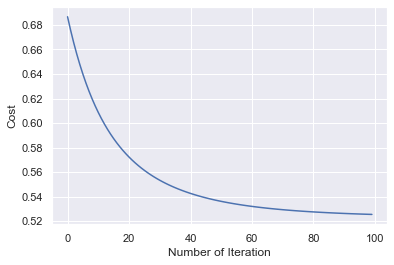

Manuel Test Accuracy: 77.89%


In [184]:
lgnn=logistic_regression(x_train,y_train,x_test,y_test,.1,100)
accuracies['logistic_regression_NN'] = lgnn
print("Manuel Test Accuracy: {:.2f}%".format(lgnn))

iteration: 50
cost: 0.5366345878872485


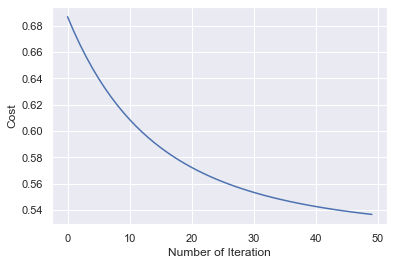

iteration: 100
cost: 0.525468061646591


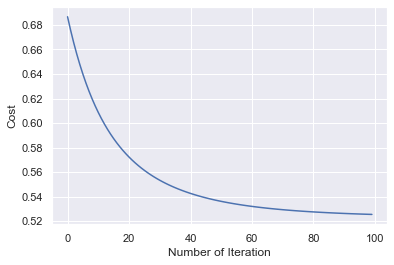

iteration: 150
cost: 0.5236433120549662


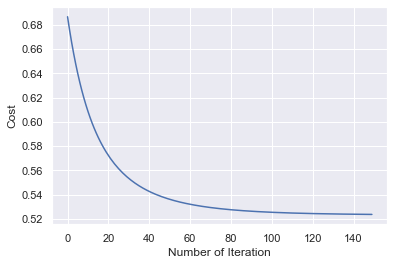

iteration: 200
cost: 0.523262060800435


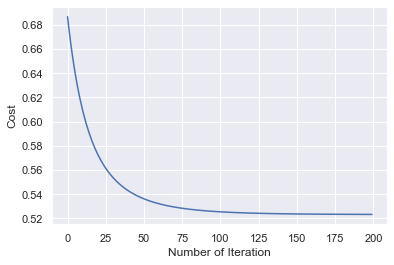

iteration: 250
cost: 0.52317271497806


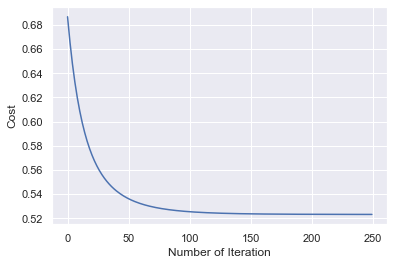

iteration: 300
cost: 0.5231500251862431


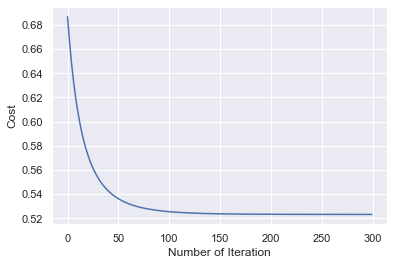

iteration: 350
cost: 0.5231438161360589


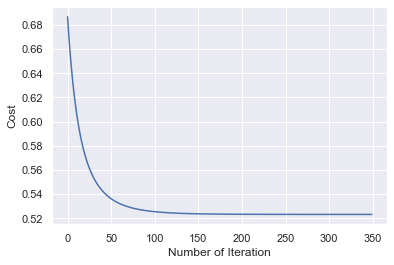

iteration: 400
cost: 0.5231419790348406


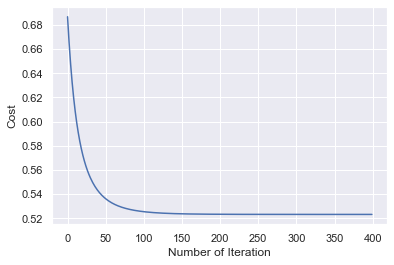

iteration: 450
cost: 0.5231413898232785


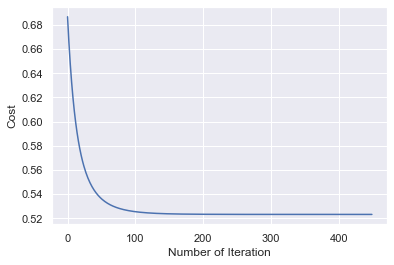

iteration: 500
cost: 0.5231411857446577


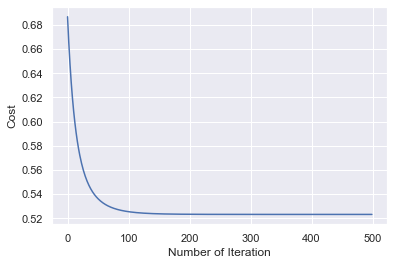

iteration: 550
cost: 0.5231411102304898


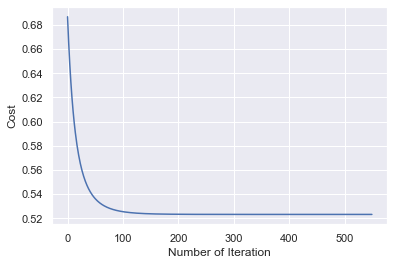

iteration: 600
cost: 0.5231410808102998


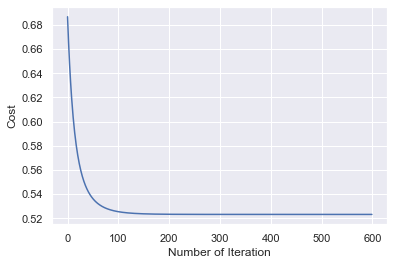

iteration: 650
cost: 0.5231410689138257


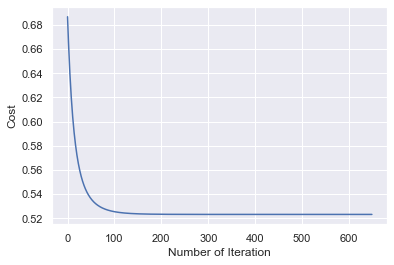

iteration: 700
cost: 0.5231410639793999


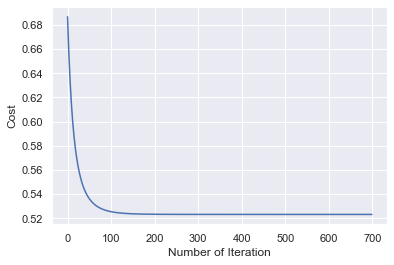

iteration: 750
cost: 0.5231410618979881


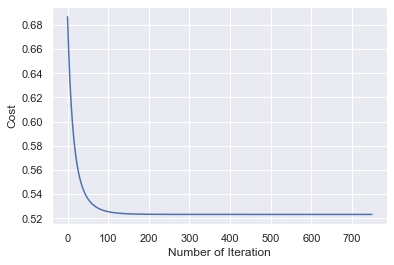

iteration: 800
cost: 0.5231410610103808


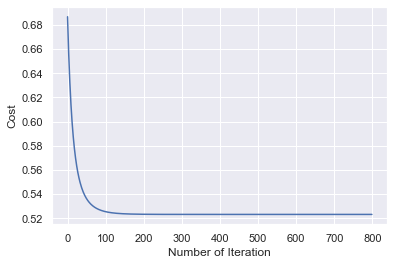

iteration: 850
cost: 0.5231410606291936


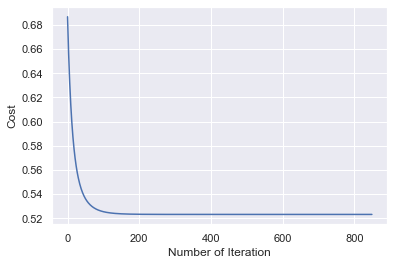

iteration: 900
cost: 0.523141060464749


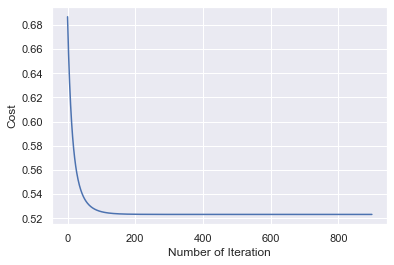

iteration: 950
cost: 0.5231410603936003


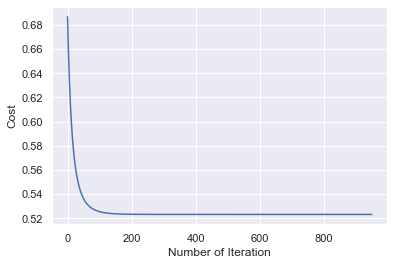

iteration: 1000
cost: 0.523141060362759


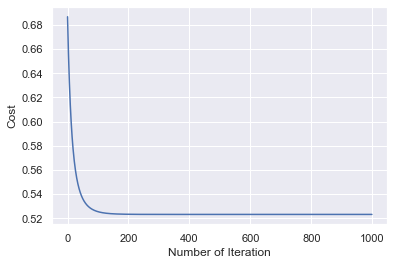

The maximum of Acccracy occurs when iteration is : 100


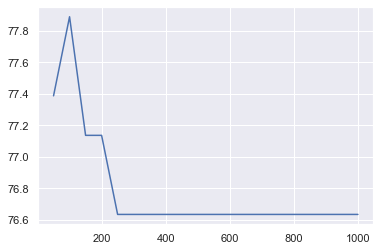

In [185]:
xx=range(50,1001,50)
nn=[]
for i in xx:
    lgnn=logistic_regression(x_train,y_train,x_test,y_test,.1,i)
    nn.append(lgnn)
plt.plot(xx, nn)

print("The maximum of Acccracy occurs when iteration is :" ,xx[nn.index(max(nn))])


In [186]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 2)  # n_neighbors means k
knn.fit(x_train.T, y_train.T)
prediction = knn.predict(x_test.T)

print("{} NN Score: {:.2f}%".format(2, knn.score(x_test.T, y_test.T)*100))

2 NN Score: 78.89%


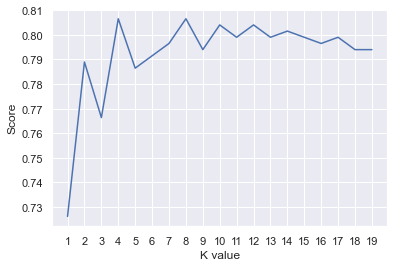

Maximum KNN Score is 80.65%
The Maximun KNN is  4


In [187]:
# try ro find best k value
scoreList = []
for i in range(1,20):
    knn2 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn2.fit(x_train.T, y_train.T)
    scoreList.append(knn2.score(x_test.T, y_test.T))
    
plt.plot(range(1,20), scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

acc = max(scoreList)*100
accuracies['KNN'] = acc
print("Maximum KNN Score is {:.2f}%".format(acc))
print("The Maximun KNN is ",range(1,20)[scoreList.index(max(scoreList))])


In [188]:
xd=x_data
xd_train, xd_test, yd_train, yd_test = train_test_split(xd,y,test_size = 0.2,random_state=0)

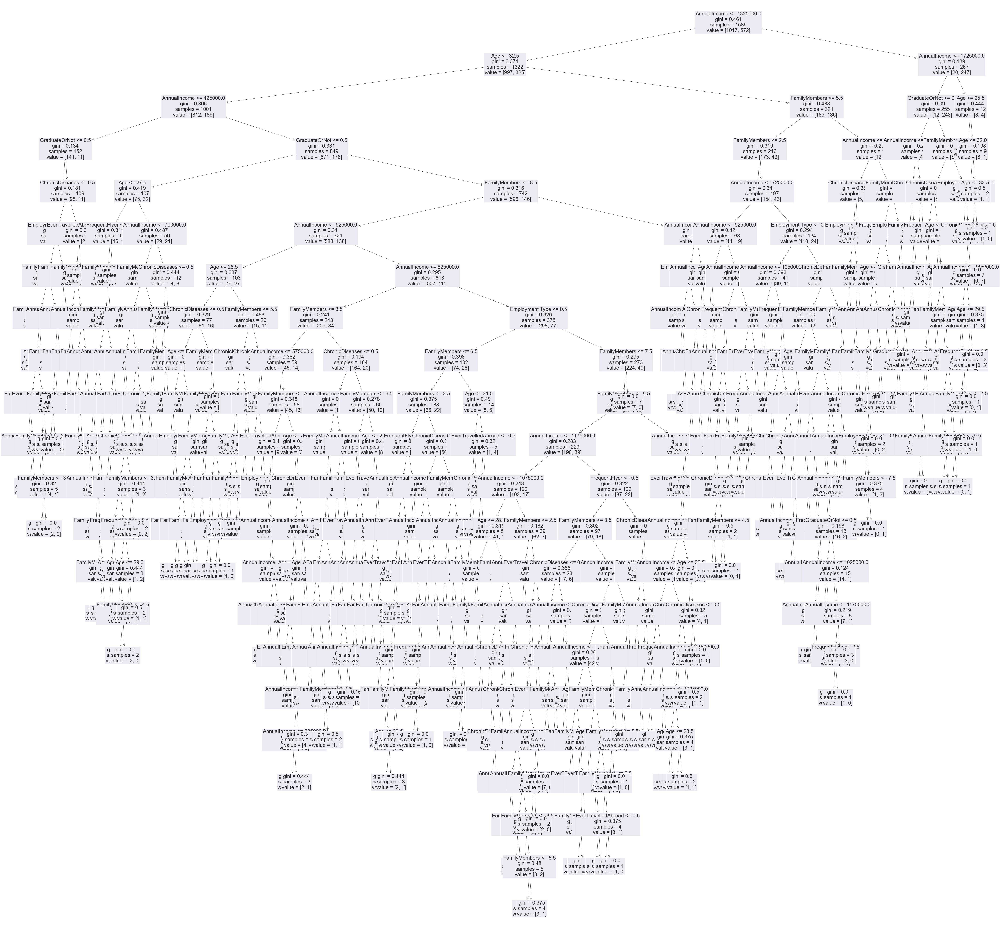

Decision Tree Test Accuracy 76.38%


In [189]:
from sklearn.tree import DecisionTreeClassifier,plot_tree
name=x_data.columns.tolist()
dtc = DecisionTreeClassifier()
dtc.fit(xd_train, yd_train)

plt.figure(figsize=(100,100))
plot_tree(dtc, fontsize=30 ,feature_names=name)
plt.show()

# predict
acc = dtc.score(xd_test, yd_test)*100
accuracies['Decision Tree'] = acc
print("Decision Tree Test Accuracy {:.2f}%".format(acc))

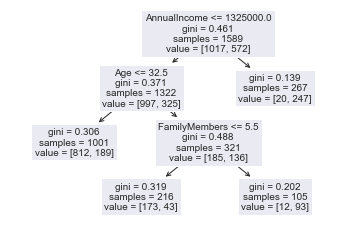

Decision Tree Prune Test Accuracy 82.16%


In [190]:
#======= a single tree: pruned via minimal cost-complexity pruning
dtcp = DecisionTreeClassifier(ccp_alpha = 0.01)
dtcp.fit(xd_train, yd_train)
plot_tree(dtcp, filled=False,feature_names=name)
plt.show()

# predict
acc = dtcp.score(xd_test, yd_test)*100
accuracies['Decision Tree Prune'] = acc
print("Decision Tree Prune Test Accuracy {:.2f}%".format(acc))

In [191]:
# Bagging Classification
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 1000, random_state = 1)
rf.fit(x_train.T, y_train.T)

acc = rf.score(x_test.T,y_test.T)*100
accuracies['Bagging'] = acc
print("Bagging Accuracy Score : {:.2f}%".format(acc))

Bagging Accuracy Score : 79.15%


# Compare models

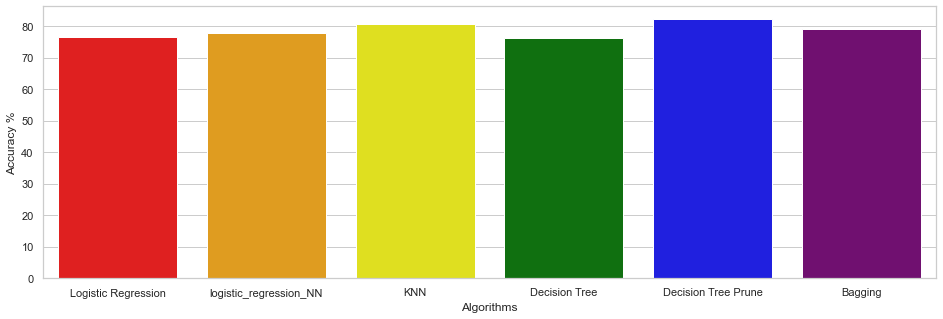

In [192]:
colors = ["red",  "orange","yellow", "green","blue","purple"]

sns.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,100,10))
plt.ylabel("Accuracy %")
plt.xlabel("Algorithms")
sns.barplot(x=list(accuracies.keys()), y=list(accuracies.values()), palette=colors)
plt.show()

In [193]:
# Predicted values
y_head_lrnn=lrnn_yhead(x_train,y_train,x_test,y_test,0.1,100).flatten()
y_head_lr = lr.predict(x_test.T)
knn_3 = KNeighborsClassifier(n_neighbors = 3)
knn_3.fit(x_train.T, y_train.T)
y_head_knn = knn_3.predict(x_test.T)
y_head_dtc = dtc.predict(x_test.T)
y_head_dtcp = dtcp.predict(x_test.T)
y_head_rf = rf.predict(x_test.T)

In [194]:
from sklearn.metrics import confusion_matrix

cm_lrnn =confusion_matrix(y_test,y_head_lrnn)
cm_lr = confusion_matrix(y_test,y_head_lr)
cm_knn = confusion_matrix(y_test,y_head_knn)
cm_dtc = confusion_matrix(y_test,y_head_dtc)
cm_dtcp= confusion_matrix(y_test,y_head_dtcp)
cm_rf = confusion_matrix(y_test,y_head_rf)

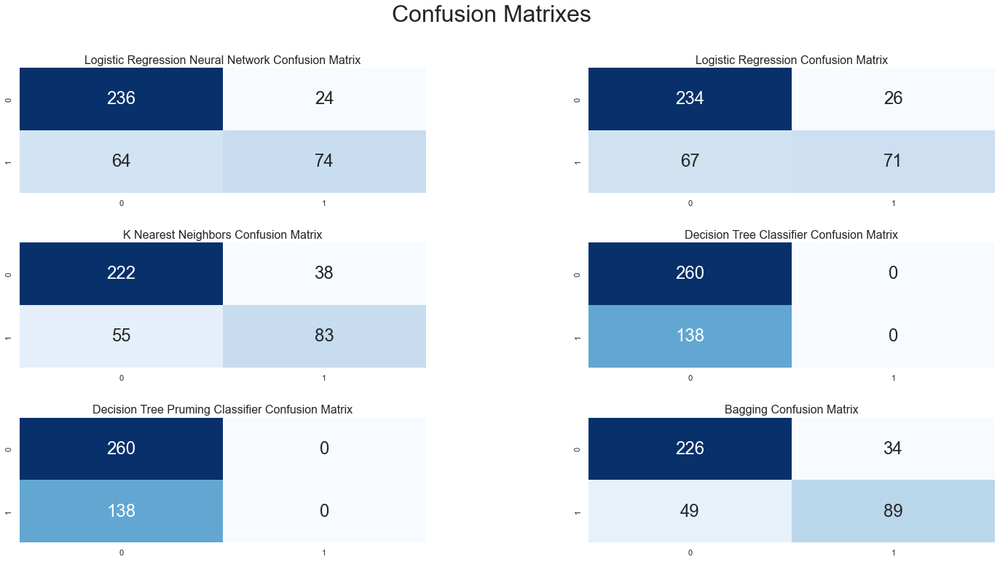

In [195]:
plt.figure(figsize=(24,12))

plt.suptitle("Confusion Matrixes",fontsize=24,size=32)
plt.subplots_adjust(wspace = 0.4, hspace= 0.4)

plt.subplot(3,2,1)
plt.title("Logistic Regression Neural Network Confusion Matrix",size=16)
sns.heatmap(cm_lrnn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,2)
plt.title("Logistic Regression Confusion Matrix",size=16)
sns.heatmap(cm_lr,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,3)
plt.title("K Nearest Neighbors Confusion Matrix",size=16)
sns.heatmap(cm_knn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})


plt.subplot(3,2,4)
plt.title("Decision Tree Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtc,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,5)
plt.title("Decision Tree Pruming Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtcp,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,6)
plt.title("Bagging Confusion Matrix",size=16)
sns.heatmap(cm_rf,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.show()

# Selecting Parameters

In [196]:
y = data.TravelInsurance.values
x_data = data.drop(['TravelInsurance'], axis = 1)

In [197]:
# Normalize
from sklearn.preprocessing import StandardScaler
ss_fit = StandardScaler().fit(x_data)
x = ss_fit.transform(x_data)
#x = (x_data - np.min(x_data)) / (np.max(x_data) - np.min(x_data)).values

In [198]:
x.shape

(1987, 8)

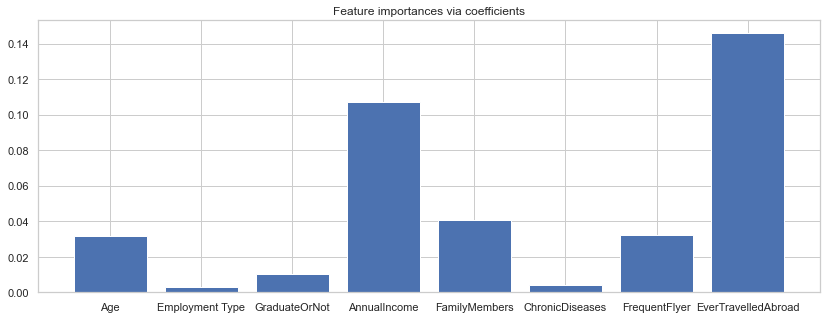

In [199]:
#select factors
from sklearn.linear_model import LassoCV

lasso = LassoCV().fit(x, y)
importance = np.abs(lasso.coef_)
feature_names = np.array(x_data.columns)
plt.figure(figsize=(14,5))
plt.bar(height=importance, x=feature_names)
plt.title("Feature importances via coefficients")
plt.show()

In [200]:
x=np.delete(x, [1,2,5], 1)
#5 factors: Age, Annual income, Family Members, FrequencyFlyer, Ever Travelled Abroad

In [201]:
# Split train and test set
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=0)
x_train = x_train.T
y_train = y_train.T
x_test = x_test.T
y_test = y_test.T

# Modeling with five selected Parameters

In [202]:
accuracies = {}

iteration: 100
cost: 0.5263271311902352


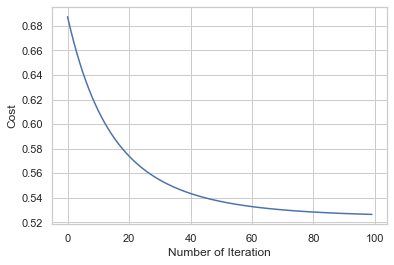

Manuel Test Accuracy: 77.89%


In [203]:
lgnn=logistic_regression(x_train,y_train,x_test,y_test,.1,100)
accuracies['logistic_regression_NN'] = lgnn
print("Manuel Test Accuracy: {:.2f}%".format(lgnn))

In [204]:
lr = LogisticRegression()
lr.fit(x_train.T,y_train.T)
acc = lr.score(x_test.T,y_test.T)*100

accuracies['Logistic Regression'] = acc
print("Test Accuracy {:.2f}%".format(acc))

Test Accuracy 77.14%


In [205]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 2)  # n_neighbors means k
knn.fit(x_train.T, y_train.T)
prediction = knn.predict(x_test.T)

print("{} NN Score: {:.2f}%".format(2, knn.score(x_test.T, y_test.T)*100))

2 NN Score: 77.64%


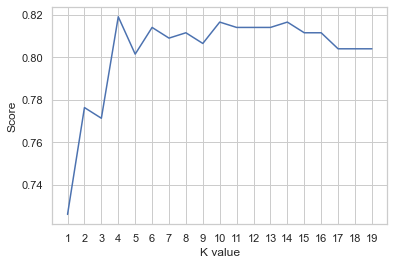

Maximum KNN Score is 81.91%
The Maximun KNN is  4


In [206]:
# try ro find best k value
scoreList = []
for i in range(1,20):
    knn2 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn2.fit(x_train.T, y_train.T)
    scoreList.append(knn2.score(x_test.T, y_test.T))
    
plt.plot(range(1,20), scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

acc = max(scoreList)*100
accuracies['KNN'] = acc
print("Maximum KNN Score is {:.2f}%".format(acc))
print("The Maximun KNN is ",range(1,20)[scoreList.index(max(scoreList))])

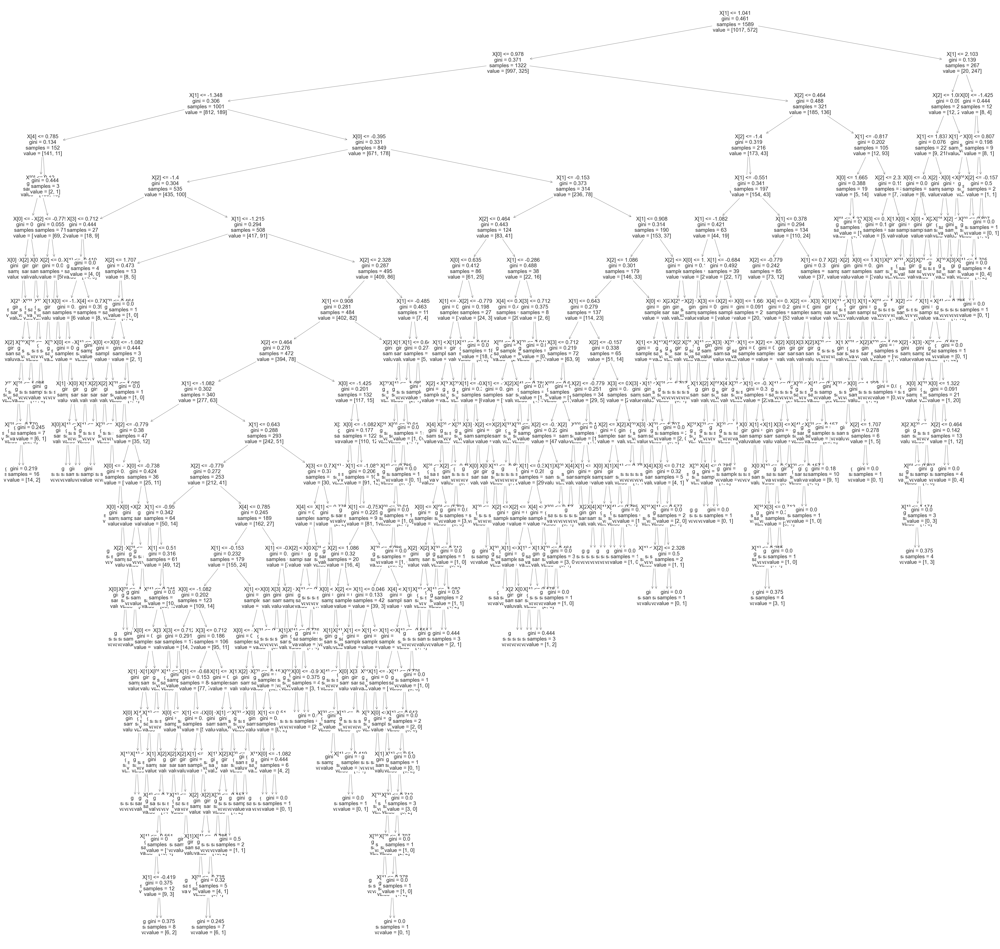

Decision Tree Test Accuracy 76.38%


In [207]:
from sklearn.tree import DecisionTreeClassifier,plot_tree

dtc = DecisionTreeClassifier()
dtc.fit(x_train.T, y_train.T)

plt.figure(figsize=(100,100))
plot_tree(dtc, fontsize=30)
plt.show()

# predict
acc = dtc.score(x_test.T, y_test.T)*100
accuracies['Decision Tree'] = acc
print("Decision Tree Test Accuracy {:.2f}%".format(acc))

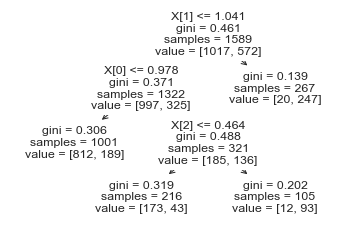

Decision Tree Prune Test Accuracy 82.16%


In [208]:
#======= a single tree: pruned via minimal cost-complexity pruning
dtcp = DecisionTreeClassifier(ccp_alpha = 0.01)
dtcp.fit(x_train.T, y_train.T)
plot_tree(dtcp, filled=False)
plt.show()

# predict
acc = dtcp.score(x_test.T, y_test.T)*100
accuracies['Decision Tree Prune'] = acc
print("Decision Tree Prune Test Accuracy {:.2f}%".format(acc))

In [209]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 1000, random_state = 1)
rf.fit(x_train.T, y_train.T)

acc = rf.score(x_test.T,y_test.T)*100
accuracies['Bagging'] = acc
print("Bagging Accuracy Score : {:.2f}%".format(acc))

Bagging Accuracy Score : 80.65%


# Compare models

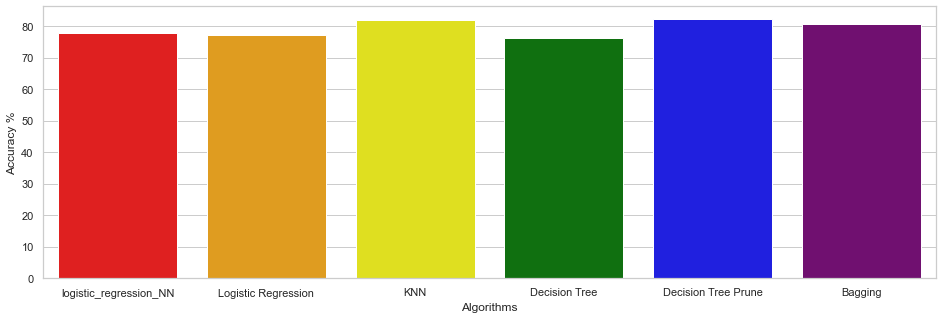

In [210]:
colors = ["red",  "orange","yellow", "green","blue","purple"]

sns.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,100,10))
plt.ylabel("Accuracy %")
plt.xlabel("Algorithms")
sns.barplot(x=list(accuracies.keys()), y=list(accuracies.values()), palette=colors)
plt.show()

In [211]:
# Predicted values
y_head_lrnn=lrnn_yhead(x_train,y_train,x_test,y_test,.1,100).flatten()
y_head_lr = lr.predict(x_test.T)
knn_3 = KNeighborsClassifier(n_neighbors = 3)
knn_3.fit(x_train.T, y_train.T)
y_head_knn = knn_3.predict(x_test.T)
y_head_dtc = dtc.predict(x_test.T)
y_head_dtcp = dtcp.predict(x_test.T)
y_head_rf = rf.predict(x_test.T)

In [212]:
from sklearn.metrics import confusion_matrix
cm_lrnn =confusion_matrix(y_test,y_head_lrnn)
cm_lr = confusion_matrix(y_test,y_head_lr)
cm_knn = confusion_matrix(y_test,y_head_knn)
cm_dtc = confusion_matrix(y_test,y_head_dtc)
cm_dtcp= confusion_matrix(y_test,y_head_dtcp)
cm_rf = confusion_matrix(y_test,y_head_rf)

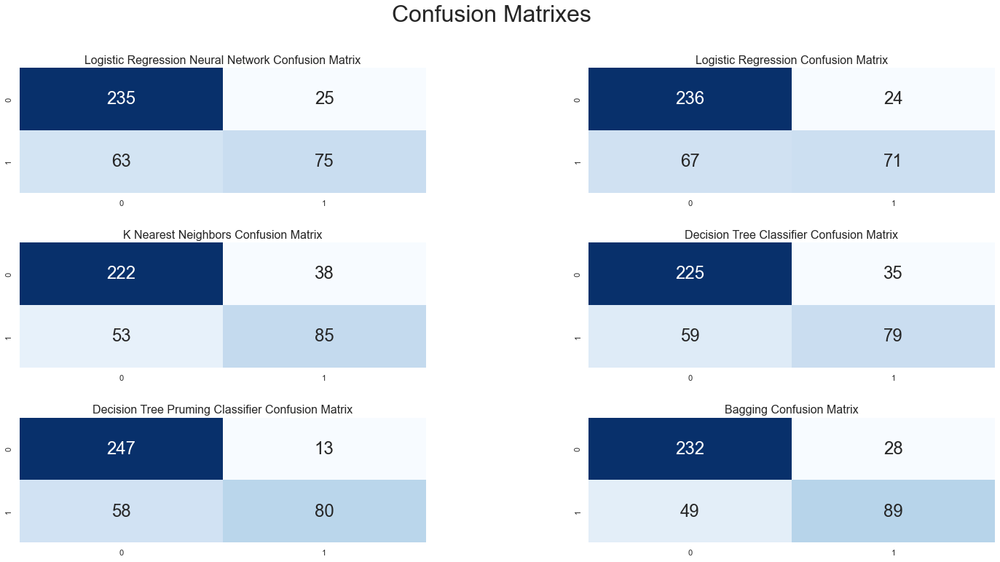

In [213]:
plt.figure(figsize=(24,12))

plt.suptitle("Confusion Matrixes",fontsize=24,size=32)
plt.subplots_adjust(wspace = 0.4, hspace= 0.4)

plt.subplot(3,2,1)
plt.title("Logistic Regression Neural Network Confusion Matrix",size=16)
sns.heatmap(cm_lrnn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,2)
plt.title("Logistic Regression Confusion Matrix",size=16)
sns.heatmap(cm_lr,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,3)
plt.title("K Nearest Neighbors Confusion Matrix",size=16)
sns.heatmap(cm_knn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})


plt.subplot(3,2,4)
plt.title("Decision Tree Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtc,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,5)
plt.title("Decision Tree Pruming Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtcp,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,6)
plt.title("Bagging Confusion Matrix",size=16)
sns.heatmap(cm_rf,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.show()

#  Modeling with three selected Parameters

In [214]:
y = data.TravelInsurance.values
x_data = data.drop(['TravelInsurance'], axis = 1)

In [215]:
# Normalize
from sklearn.preprocessing import StandardScaler
ss_fit = StandardScaler().fit(x_data)
x = ss_fit.transform(x_data)

In [216]:
x=np.delete(x, [0,1,2,5,6], 1)
#3 factors:Annual income , Family member , Ever travel before

In [217]:
# Split train and test set
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=0)
x_train = x_train.T
y_train = y_train.T
x_test = x_test.T
y_test = y_test.T

In [218]:
accuracies = {}

iteration: 100
cost: 0.5321283157357334


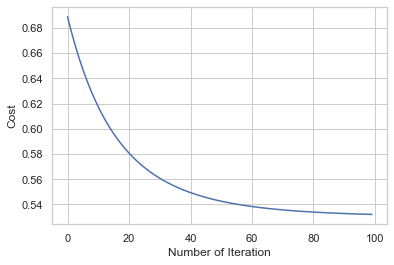

Manuel Test Accuracy: 77.14%


In [219]:
lgnn=logistic_regression(x_train,y_train,x_test,y_test,.1,100)
accuracies['logistic_regression_NN'] = lgnn
print("Manuel Test Accuracy: {:.2f}%".format(lgnn))

In [220]:
lr = LogisticRegression()
lr.fit(x_train.T,y_train.T)
acc = lr.score(x_test.T,y_test.T)*100

accuracies['Logistic Regression'] = acc
print("Test Accuracy {:.2f}%".format(acc))

Test Accuracy 76.38%


In [221]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors = 2)  # n_neighbors means k
knn.fit(x_train.T, y_train.T)
prediction = knn.predict(x_test.T)

print("{} NN Score: {:.2f}%".format(2, knn.score(x_test.T, y_test.T)*100))

2 NN Score: 77.14%


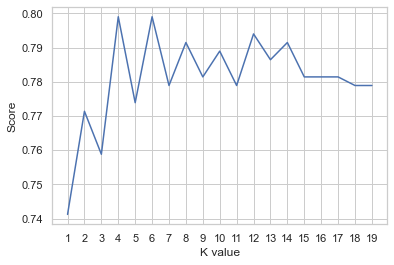

Maximum KNN Score is 79.90%
The Maximun KNN is  4


In [222]:
# try ro find best k value
scoreList = []
for i in range(1,20):
    knn2 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn2.fit(x_train.T, y_train.T)
    scoreList.append(knn2.score(x_test.T, y_test.T))
    
plt.plot(range(1,20), scoreList)
plt.xticks(np.arange(1,20,1))
plt.xlabel("K value")
plt.ylabel("Score")
plt.show()

acc = max(scoreList)*100
accuracies['KNN'] = acc
print("Maximum KNN Score is {:.2f}%".format(acc))
print("The Maximun KNN is ",range(1,20)[scoreList.index(max(scoreList))])

In [223]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(x_train.T, y_train.T)

acc = dtc.score(x_test.T, y_test.T)*100
accuracies['Decision Tree'] = acc
print("Decision Tree Test Accuracy {:.2f}%".format(acc))

Decision Tree Test Accuracy 78.39%


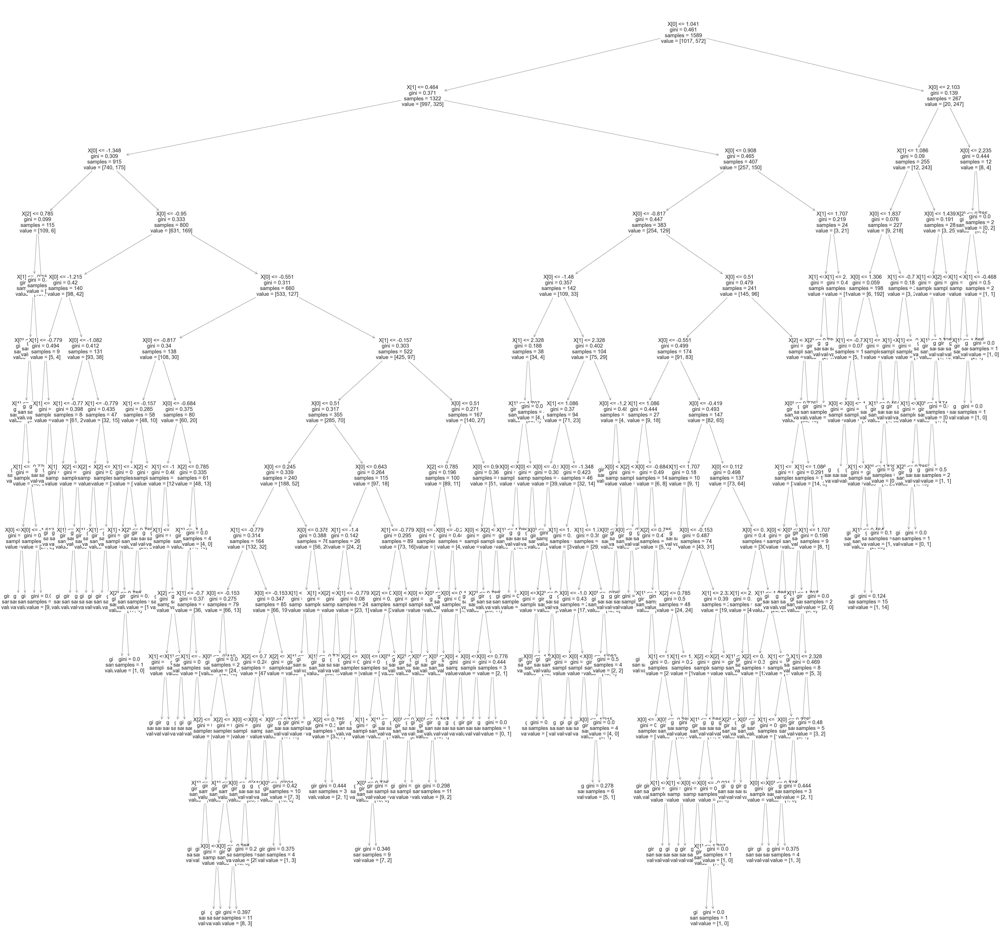

Decision Tree Test Accuracy 78.39%


In [224]:
from sklearn.tree import DecisionTreeClassifier,plot_tree

dtc = DecisionTreeClassifier()
dtc.fit(x_train.T, y_train.T)

plt.figure(figsize=(100,100))
plot_tree(dtc, fontsize=30)
plt.show()

# predict
acc = dtc.score(x_test.T, y_test.T)*100
accuracies['Decision Tree'] = acc
print("Decision Tree Test Accuracy {:.2f}%".format(acc))

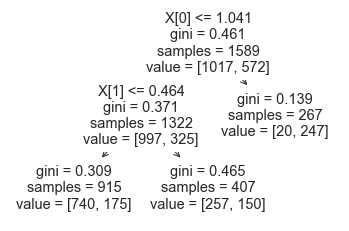

Decision Tree Prune Test Accuracy 80.40%


In [225]:
#======= a single tree: pruned via minimal cost-complexity pruning
dtcp = DecisionTreeClassifier(ccp_alpha = 0.01)
dtcp.fit(x_train.T, y_train.T)
plot_tree(dtcp, filled=False)
plt.show()

# predict
acc = dtcp.score(x_test.T, y_test.T)*100
accuracies['Decision Tree Prune'] = acc
print("Decision Tree Prune Test Accuracy {:.2f}%".format(acc))

In [226]:
# Random Forest Classification
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 1000, random_state = 1)
rf.fit(x_train.T, y_train.T)

acc = rf.score(x_test.T,y_test.T)*100
accuracies['Bagging'] = acc
print("Bagging Accuracy Score : {:.2f}%".format(acc))

Bagging Accuracy Score : 77.64%


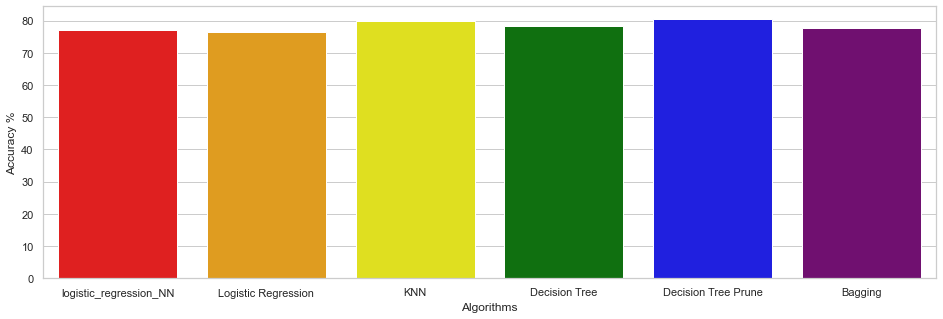

{'logistic_regression_NN': 77.1356783919598, 'Logistic Regression': 76.38190954773869, 'KNN': 79.89949748743719, 'Decision Tree': 78.39195979899498, 'Decision Tree Prune': 80.40201005025126, 'Bagging': 77.63819095477386}


In [227]:
colors = ["red",  "orange","yellow", "green","blue","purple"]

sns.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,100,10))
plt.ylabel("Accuracy %")
plt.xlabel("Algorithms")
sns.barplot(x=list(accuracies.keys()), y=list(accuracies.values()), palette=colors)
plt.show()
print(accuracies)

In [228]:
# Predicted values
y_head_lrnn=lrnn_yhead(x_train,y_train,x_test,y_test,0.1,100).flatten()
y_head_lr = lr.predict(x_test.T)
knn_3 = KNeighborsClassifier(n_neighbors = 3)
knn_3.fit(x_train.T, y_train.T)
y_head_knn = knn_3.predict(x_test.T)
y_head_dtc = dtc.predict(x_test.T)
y_head_dtcp = dtcp.predict(x_test.T)
y_head_rf = rf.predict(x_test.T)

In [229]:
from sklearn.metrics import confusion_matrix
cm_lrnn =confusion_matrix(y_test,y_head_lrnn)
cm_lr = confusion_matrix(y_test,y_head_lr)
cm_knn = confusion_matrix(y_test,y_head_knn)
cm_dtc = confusion_matrix(y_test,y_head_dtc)
cm_dtcp= confusion_matrix(y_test,y_head_dtcp)
cm_rf = confusion_matrix(y_test,y_head_rf)

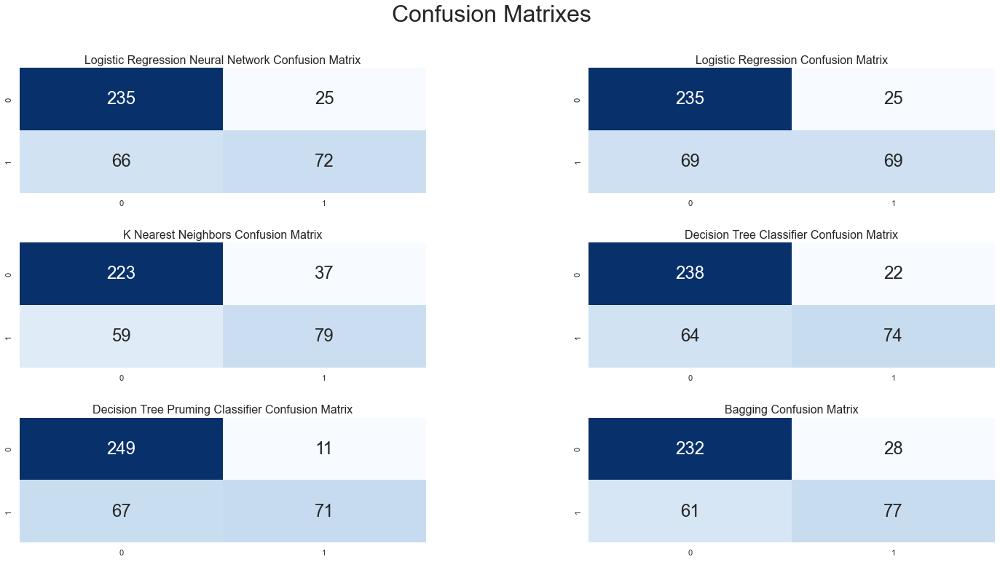

In [230]:
plt.figure(figsize=(24,12))

plt.suptitle("Confusion Matrixes",fontsize=24,size=32)
plt.subplots_adjust(wspace = 0.4, hspace= 0.4)

plt.subplot(3,2,1)
plt.title("Logistic Regression Neural Network Confusion Matrix",size=16)
sns.heatmap(cm_lrnn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,2)
plt.title("Logistic Regression Confusion Matrix",size=16)
sns.heatmap(cm_lr,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,3)
plt.title("K Nearest Neighbors Confusion Matrix",size=16)
sns.heatmap(cm_knn,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})


plt.subplot(3,2,4)
plt.title("Decision Tree Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtc,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,5)
plt.title("Decision Tree Pruming Classifier Confusion Matrix",size=16)
sns.heatmap(cm_dtcp,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.subplot(3,2,6)
plt.title("Bagging Confusion Matrix",size=16)
sns.heatmap(cm_rf,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})

plt.show()